<a href="https://colab.research.google.com/github/liadekel/analyzing-big-data/blob/master/TestAnalyzingBigData.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 1. `COVID19` Spread in China:

###Part 1



**Theory**:

`COVID19` changed our daily life in many different aspects:
 Starting from the outbrake period in which big parts of the world population  were **qurantined**, to the almost total cancelation of **traveling** and worldwide **economy** shipments.

In my point of view by focusing on these 3 main aspects one can describe `COVID19` spread.

1. Around the web there is plenty data regarding number of `new cases`, `recoverd` and `deaths`. A good way to descrbie the fight against the virus will be presenting number of `active` cases. number of `active` cases is more useful
since it's a combination of the new cases and recoverd cases. Putting these numbers on map can give us a good picture of the **improvement**/**deterioration** in each city in china and to show us what are the centers
of burst.

2. This data can be sliced with `number of flights` that were canceled. The more new cases then the country decided to close it's borders and be qurantined. Flights are related to **economic** trades or shippments and **traveling** as well (two aspect that were majory hurt) hence they are a very good data to see impact on. We can even undesrstand which countries state is worse by analyzing the destinations of the canceled flights.

The way i see it, people with money are the first to respond (not always correctly). Hence perhaps we can predict certain improvement/deterioration by taking a closer look on the economic data. Some people think that `China` hided `COVID19`, since `China` is a very big economic power perhaps changes in the ecomonic field would predict `COVID19`. 

In [ ]:
!mkdir ./datasets/novel-covid19

# download the dataset from Kaggle and unzip it
!kaggle datasets download sudalairajkumar/novel-corona-virus-2019-dataset -p ./datasets/novel-covid19
!unzip ./datasets/novel-covid19/*.zip  -d ./datasets/novel-covid19
!ls ./datasets/novel-covid19

mkdir: cannot create directory ‘./datasets/novel-covid19’: File exists
novel-corona-virus-2019-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  ./datasets/novel-covid19/novel-corona-virus-2019-dataset.zip
replace ./datasets/novel-covid19/COVID19_line_list_data.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace ./datasets/novel-covid19/COVID19_open_line_list.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: ./datasets/novel-covid19/COVID19_open_line_list.csv  
  inflating: ./datasets/novel-covid19/covid_19_data.csv  
  inflating: ./datasets/novel-covid19/time_series_covid_19_confirmed.csv  
  inflating: ./datasets/novel-covid19/time_series_covid_19_confirmed_US.csv  
  inflating: ./datasets/novel-covid19/time_series_covid_19_deaths.csv  
  inflating: ./datasets/novel-covid19/time_series_covid_19_deaths_US.csv  
  inflating: ./datasets/novel-covid19/time_series_covid_19_recovered.csv  
covid_19_data.csv		     time_series_c

**Gernal spread of `COVID-19` in china:**

In [ ]:
import pandas as pd

COVID_19_PATH = "./datasets/novel-covid19/covid_19_data.csv"

covid_19_df = pd.read_csv(COVID_19_PATH)

# reduce to only china related
covid_19_df = covid_19_df[ covid_19_df['Country/Region'] == 'Mainland China']
# let's add active column as well
covid_19_df['Active'] = covid_19_df['Confirmed'] - covid_19_df['Recovered']

In [ ]:
covid_19_df

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered,Active
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0,1.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0,14.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0,6.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0,1.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
52389,52390,06/28/2020,Tianjin,Mainland China,2020-06-29 04:33:44,198.0,3.0,194.0,4.0
52390,52391,06/28/2020,Tibet,Mainland China,2020-06-29 04:33:44,1.0,0.0,1.0,0.0
52454,52455,06/28/2020,Xinjiang,Mainland China,2020-06-29 04:33:44,76.0,3.0,73.0,3.0
52462,52463,06/28/2020,Yunnan,Mainland China,2020-06-29 04:33:44,185.0,2.0,183.0,2.0


In [ ]:
!mkdir ./datasets/china-geojson

# since china provinces is not appearing in plotly as 'official' location, in order to color the differnet 
# regions we will need to use costume geojsons.
# download the china-geojson from Kaggle and unzip it
!kaggle datasets download quanncore/china-province-geojson -p ./datasets/china-geojson
!unzip ./datasets/china-geojson/*.zip  -d ./datasets/china-geojson
!ls ./datasets/china-geojson

mkdir: cannot create directory ‘./datasets/china-geojson’: File exists
china-province-geojson.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  ./datasets/china-geojson/china-province-geojson.zip
replace ./datasets/china-geojson/gadm36_CHN_1.json? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: ./datasets/china-geojson/gadm36_CHN_1.json  
china-province-geojson.zip  gadm36_CHN_1.json


In [ ]:
! pip install plotly
! pip install seaborn

In [ ]:
import json
import plotly_express as px

with open('./datasets/china-geojson/gadm36_CHN_1.json') as f: 
     china_geojson = json.load(f)

px.choropleth(covid_19_df,
              geojson=china_geojson,
              locations='Province/State',
              color='Active',
              color_continuous_scale="Viridis",
              scope='asia',
              range_color=(0, 8000),
              featureidkey='properties.NAME_1',
              animation_frame='ObservationDate',
              title="Number of Active COVID-19 Cases")

# Guess which place is the one in the middle ? HUBEI district of course, the origin of the COVID19 virus.

###Part 2

Impact of `COVID-19` on **public health and social measures** in china:

In [ ]:
import pandas as pd

# load covid-19 phsm dataset:
df_phsm = pd.read_csv('https://query.data.world/s/wxxvfcid6ml23uo2zmemna53lfh5y2', encoding="ISO-8859-1")

df_phsm_china = df[df['iso'] == 'CHN']
df_phsm_china

,number,who_id,dataset,prop_id,who_region,country_territory_area,iso,iso_3166_1_numeric,admin_level,area_covered,prov_category,prov_subcategory,prov_measure,who_code,who_category,who_subcategory,who_measure,targeted,value_usd,percent_interest,comments,non_compliance,response_type,source,source_type,link,source_alt,date_start,date_end,date_entry
176,177,ACAPS_177,ACAPS,178,WPRO,China,CHN,156,national,NaN,Social distancing,NaN,Schools closureÂ,4.1.2,Social and physical distancing measures,School measures,Closing,Yes,NaN,NaN,SCFN's (schools for the children of foreign na...,Not applicable,Introduction / extension of measures,iscresearch,Other,https://www.iscresearch.com/cornavirus-covid-1...,NaN,NaN,NaN,15/03/2020
177,178,ACAPS_178,ACAPS,179,WPRO,China,CHN,156,national,NaN,Social distancing,NaN,Public services closureÂ,4,Social and physical distancing measures,NaN,NaN,No,NaN,NaN,NaN,Not applicable,Introduction / extension of measures,NaN,NaN,NaN,NaN,NaN,NaN,15/03/2020
178,179,ACAPS_179,ACAPS,180,WPRO,China,CHN,156,national,NaN,Public health measures,NaN,Introduction of isolation and quarantine policies,3.1.3,Surveillance and response measures,Detecting and isolating cases,Isolation,Yes,NaN,NaN,all people with symptoms and in some regions t...,Not applicable,Introduction / extension of measures,Ministry of Health,Government,http://en.nhc.gov.cn/2020-03/15/c_77737.htm,NaN,NaN,NaN,15/03/2020
179,180,ACAPS_180,ACAPS,181,WPRO,China,CHN,156,national,NaN,Social distancing,NaN,Limit public gatherings,4.3,Social and physical distancing measures,"Gatherings, businesses and services",NaN,No,NaN,NaN,all provincial-level regions on the Chinese ma...,Not applicable,Introduction / extension of measures,Ministry of Health,Government,http://en.nhc.gov.cn/2020-03/11/c_77645.htm,NaN,29/01/2020,NaN,15/03/2020
180,181,ACAPS_181,ACAPS,182,WPRO,China,CHN,156,national,NaN,Governance and socio-economic measures,NaN,Economic measures,8.3,Other measures,NaN,Financial packages,Yes,NaN,NaN,people with low income levels,Not applicable,Introduction / extension of measures,Ministry of Health,Government,http://en.nhc.gov.cn/2020-03/15/c_77737.htm,NaN,14/03/2020,NaN,15/03/2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27481,27915,CSHVienna_3202,CSHVienna,3203,WPRO,China,CHN,156,other,Taiwan,Travel restriction,Airport restriction,No boarding from Taiwan,5.3,International travel measures,NaN,Restricting entry,NaN,NaN,NaN,extended to April 30. the policy of comprehens...,NaN,NaN,NaN,NaN,https://www.cdc.gov.tw/En/Bulletin/Detail/wX8R...,NaN,01/04/2020,NaN,01/04/2020
27482,27916,CSHVienna_3203,CSHVienna,3204,WPRO,China,CHN,156,other,Taiwan,"Case identification, contact tracing and relat...",Airport health check,Health screening,5.5,International travel measures,NaN,Entry screening and isolation or quarantine,NaN,NaN,NaN,Special management of incomings with symptoms....,NaN,NaN,NaN,NaN,https://www.cdc.gov.tw/En/Bulletin/Detail/6ems...,NaN,03/04/2020,NaN,03/04/2020
27483,27917,CSHVienna_3204,CSHVienna,3205,WPRO,China,CHN,156,other,Taiwan,Social distancing,Mandatory use of masks,In special cases,1.4,Individual measures,NaN,Wearing a mask,NaN,NaN,NaN,Taxi and Uber. Taxi drivers in Taiwan can refu...,NaN,NaN,NaN,NaN,https://www.thestar.com.my/news/regional/2020/...,NaN,04/04/2020,NaN,04/04/2020
27484,27918,CSHVienna_3205,CSHVienna,3206,WPRO,China,CHN,156,other,Taiwan,Social distancing,Special measures for certain establishments,Touristic places,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Anti-epidemic measures for crowd control. crow...,NaN,NaN,NaN,NaN,https://www.cdc.gov.tw/En/Bulletin/Detail/pCH3...,NaN,10/04/2020,NaN,10/04/2020


Influence of `COVID-19` on **goverment measures**

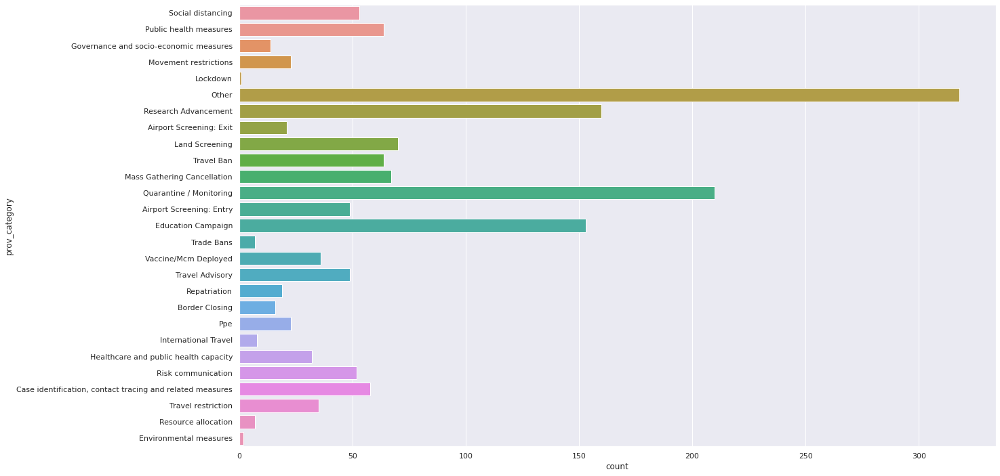

In [ ]:
import seaborn as sns

sns.set(rc={'figure.figsize':(20,12)})
sns.set(style="darkgrid")
sns.countplot(y='prov_category', data=df_phsm_china)

# We can see the count of public measures by their type during the peek of the covid19 period in china.
# It is obvious that almost all mesaures are covid related, and usually have negative conotation by that they are restricting more.
# By these we can see how the virus affeted on the focus of the goverment. The goverment is now focusing on restircting, canceling, lockdown etc.

In [ ]:
import afinn
import numpy as np

# In addition let's use sentiment analysis on the `prov_category` in order to support our claim.
afinn_object = afinn.Afinn()

def apply_affin(x):
    return afinn_object.score(x)

df_phsm_china = df_phsm_china.replace(np.nan, '', regex=True)
df_phsm_china['affin_score'] = df_phsm_china['prov_category'].apply(apply_affin)
number_not_zeros = df_phsm_china['affin_score'].astype(bool).sum(axis=0)
print(f"avg afinn score is: {df_phsm_china['affin_score'].sum()/float(number_not_zeros)}")


avg afinn score is: -2.0


Influence of `COVID-19` on **education**:

In [ ]:
import pandas as pd
import numpy as np

df_education = pd.read_csv('https://query.data.world/s/tx2u2gwb4swij7vykpg57wsrukzozn')
df_education_china = df_education[df_education['Country'] == 'China']

# in order to have a more accurate status of the eductaion we will give each note a grade
# since it adds more information regarding the state

scale_reward_dict = {
    'Localized':1,
    'National':2,
}

note_reward_dict = {
    'School re-opening is progressive, and in selected regions, generally starting with students in the last year of secondary education. However, in larger regions, most schools remain closed':0.5,
    'Some schools have re-opened in certain regions, but most remain closed':0.75,
    np.nan : 1
}

df_education_china['datetime'] = pd.to_datetime(df_education_china['Date'])  
df_education_china = df_education_china[df_education_china['datetime'] < '2020-06-01']
df_education_china['Note'] = df_education_china['Note'].replace(note_reward_dict)
df_education_china['Scale'] = df_education_china['Scale'].replace(scale_reward_dict)
df_education_china['education_status'] = df_education_china['Note'] + df_education_china['Scale'] 
df_education_china

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,Date,ISO,Country,Scale,Note,datetime,education_status
0,16/02/2020,CHN,China,1,1.0,2020-02-16,2.0
2,17/02/2020,CHN,China,1,1.0,2020-02-17,2.0
4,18/02/2020,CHN,China,1,1.0,2020-02-18,2.0
6,19/02/2020,CHN,China,1,1.0,2020-02-19,2.0
8,20/02/2020,CHN,China,1,1.0,2020-02-20,2.0
...,...,...,...,...,...,...,...
22431,01/07/2020,CHN,China,1,1.0,2020-01-07,2.0
22641,02/07/2020,CHN,China,1,1.0,2020-02-07,2.0
22851,03/07/2020,CHN,China,1,1.0,2020-03-07,2.0
23061,04/07/2020,CHN,China,1,1.0,2020-04-07,2.0


No handles with labels found to put in legend.


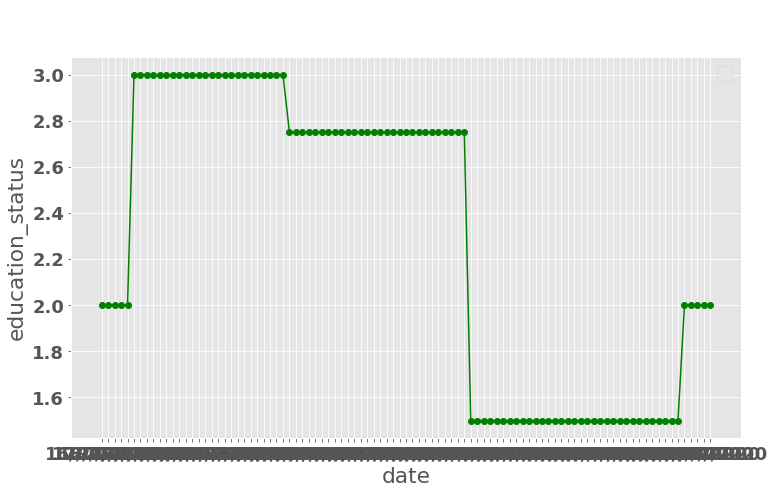

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


plt.style.use('ggplot')
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 18}

plt.rc('font', **font)
fig = plt.figure(figsize=(12, 7))
fig.suptitle('test title')
plt.xlabel('date')
plt.ylabel('education_status')
plt.legend()
plt.plot(df_education_china['Date'], df_education_china['education_status'], 'g-o')

# The idea behind this model is grading each combination of Note and Scale regarding 
# education status, and by summing them seeing a bigger picture.
# Higher result means worse state of school - i.e. close in national scale.
# each of the possible Note value can ease the state - for example 'Some schools have re-opened in certain regions' Note
# clearly means an ease, hence the grade of this Note is lower.

# The general direction seems correct - at the begging the schools were'nt closed yet, then
# they were all shut at once and later gradually opened.

In [ ]:
!mkdir ./datasets
!mkdir /root/.kaggle/

import os
import json

api_token = {"username":"liaddekel","key":"a7d9f0891eaa96ed916617baa6b51167"}

with open('/root/.kaggle/kaggle.json', 'w') as file:
  json.dump(api_token, file)

mkdir: cannot create directory ‘/root/.kaggle/’: File exists


In [ ]:
! pip install afinn
! pip install seaborn
! pip install plotly

     |████████████████████████████████| 61kB 2.7MB/s 
  Created wheel for afinn: filename=afinn-0.1-cp36-none-any.whl size=53452 sha256=d7ec30f35e9d49491fcd18e82c2e98c6b120c908d81f3933ff6cc34de5223297
  Stored in directory: /root/.cache/pip/wheels/b5/1c/de/428301f3333ca509dcf20ff358690eb23a1388fbcbbde008b2
Successfully built afinn


#2. `UFO` Sightings:

In [ ]:
!apt-get install libproj-dev proj-data proj-bin
!apt-get install libgeos-dev
!pip install cython
!pip install cartopy
!python -m spacy download en_core_web_lg

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libproj-dev is already the newest version (4.9.3-2).
proj-bin is already the newest version (4.9.3-2).
proj-data is already the newest version (4.9.3-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-440
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 33 not upgraded.
Reading package lists... Done
Building dependency tree       
Reading state information... Done
libgeos-dev is already the newest version (3.6.2-1build2).
The following package was automatically installed and is no longer required:
  libnvidia-common-440
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 33 not upgraded.
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_lg')
     |████████████████████████████████| 91.9MB 51kB/s 
     |████████████████████████████████| 327

In [ ]:
!mkdir ./datasets/ufo

# download the dataset from Kaggle and unzip it
!kaggle datasets download NUFORC/ufo-sightings -p ./datasets/ufo
!unzip ./datasets/ufo/*.zip  -d ./datasets/ufo
!ls ./datasets/ufo

mkdir: cannot create directory ‘./datasets/ufo’: File exists
ufo-sightings.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  ./datasets/ufo/ufo-sightings.zip
replace ./datasets/ufo/complete.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: ./datasets/ufo/complete.csv  
  inflating: ./datasets/ufo/scrubbed.csv  
complete.csv  scrubbed.csv  ufo-sightings.zip


1. Show UOF Meetings:

In [ ]:
import pandas as pd
ufo_sight_df = pd.read_csv('./datasets/ufo/complete.csv', error_bad_lines=False)
# reduce to alaska only
ufo_sight_alaska_df = ufo_sight_df[ufo_sight_df['state'] == 'ak']
ufo_sight_alaska_df['year'] = ufo_sight_alaska_df['datetime'].apply(lambda x: x.split(' ')[0].split('/')[2])
# sort by year
ufo_sight_alaska_df = ufo_sight_alaska_df.sort_values(by=['year'])
# convert to float (string orignally)
ufo_sight_alaska_df['latitude'] = ufo_sight_alaska_df['latitude'].astype(float)
ufo_sight_alaska_df['duration (seconds)'] = ufo_sight_alaska_df['duration (seconds)'].astype(float)

b'Skipping line 878: expected 11 fields, saw 12\nSkipping line 1713: expected 11 fields, saw 12\nSkipping line 1815: expected 11 fields, saw 12\nSkipping line 2858: expected 11 fields, saw 12\nSkipping line 3734: expected 11 fields, saw 12\nSkipping line 4756: expected 11 fields, saw 12\nSkipping line 5389: expected 11 fields, saw 12\nSkipping line 5423: expected 11 fields, saw 12\nSkipping line 5614: expected 11 fields, saw 12\nSkipping line 5849: expected 11 fields, saw 12\nSkipping line 6093: expected 11 fields, saw 12\nSkipping line 7516: expected 11 fields, saw 12\nSkipping line 7626: expected 11 fields, saw 12\nSkipping line 8893: expected 11 fields, saw 12\nSkipping line 9015: expected 11 fields, saw 12\nSkipping line 9571: expected 11 fields, saw 12\nSkipping line 9620: expected 11 fields, saw 12\nSkipping line 9751: expected 11 fields, saw 12\nSkipping line 10157: expected 11 fields, saw 12\nSkipping line 10427: expected 11 fields, saw 12\nSkipping line 12035: expected 11 fiel

In [ ]:
import plotly.express as px

fig = px.scatter_geo(ufo_sight_alaska_df, lat="latitude", lon="longitude",
                     animation_frame='year',
                     color='year',
                     hover_name='city',
                     scope='usa',
                     title = 'Locations of UFO sightings in Alaska')
fig.show()

In [ ]:
ufo_sight_alaska_df

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,year
1859,10/15/1936 17:00,eklutna,ak,us,cigar,180.0,3 minutes.,Two men approached by a cigar-shaped object in...,2/18/2001,61.458056,-149.362222,1936
44054,4/30/1943 23:00,bering sea,ak,NaN,other,3600.0,1 hour,1943 sighting of four linearly arranged red li...,3/19/2009,59.670367,-139.859082,1943
61129,7/1/1949 11:00,fairbanks,ak,us,disk,120.0,2 minutes,Enormous metallic disc in Alaska sky&#44 1949.,12/23/2013,64.837778,-147.716389,1949
51394,6/10/1949 21:00,anchorage,ak,us,disk,180.0,3 minutes,Disk encountered operation difficulties and cr...,4/16/2005,61.218056,-149.900278,1949
28578,2/1/1954 02:00,fairbanks,ak,us,unknown,1140.0,19 min.,RADAR INTERCEPT OF UFO BY USAF PILOT IN ALASKA...,1/10/2009,64.837778,-147.716389,1954
...,...,...,...,...,...,...,...,...,...,...,...,...
30777,2/21/2014 23:30,palmer,ak,us,light,300.0,5 minutes,Orange/Amber lights over the Hatcher Pass area.,2/27/2014,61.599722,-149.112778,2014
30747,2/21/2014 00:00,anchorage,ak,us,oval,4.0,4 seconds,Luminescent oval shaped craft flies over Kinca...,3/18/2014,61.218056,-149.900278,2014
30390,2/19/2014 03:00,anchorage,ak,us,flash,60.0,1 minute,Red Flashing UFO Hovering and slowly moving ri...,2/27/2014,61.218056,-149.900278,2014
37615,3/28/2014 11:17,wasilla,ak,us,changing,3600.0,~60 minutes,Red and white lights on UFO.,4/4/2014,61.581389,-149.439444,2014


2. Recognize meetings from different types:

In [ ]:
from collections import Counter
counter = Counter(ufo_sight_alaska_df['shape'])
a = range(len(ufo_sight_alaska_df['shape']))
b = counter.keys()
shape_cat = dict(zip(b,a))
ufo_sight_alaska_df['shape_int'] = ufo_sight_alaska_df['shape'].replace(shape_cat)

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# in order to discover different types of meetings i'll use clustering.
# we will start by taking only relevant columns to the clustering.
ufo_sight_alaska_different = ufo_sight_alaska_df[['year', 'duration (seconds)', 'latitude', 'longitude', 'shape_int']]
kmeans = KMeans(n_clusters=9, random_state=0).fit(ufo_sight_alaska_different)

# now we can see which meeting (row in the df) is from which type meeting (cluster).
# we can also add this information to the table
ufo_sight_alaska_different['cluster_kmeans'] = kmeans.labels_

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



3. Recognize similar meeting using the meeting comments:

In [ ]:
import spacy
import numpy as np
import turicreate as tc

nlp = spacy.load('en_core_web_lg')

In [ ]:
from math import sqrt

ufo_sight_alaska_similar = ufo_sight_alaska_df[['comments', 'shape', 'city']]
# we will use spacy in order to convert every comments string to into a vector
ufo_sight_alaska_similar['comments_vector'] = ufo_sight_alaska_similar['comments'].apply(lambda x: nlp(x).vector)

# we will convert to SFrame since it knows to create 
# clutsers from vector
sf = tc.SFrame(ufo_sight_alaska_similar)
sf['comments_vector'] = sf['comments_vector'].apply(lambda x: tc.SArray(x))

K = int(sqrt(sf.num_rows() / 2.0))
kmeans_model = tc.kmeans.create(sf, num_clusters=K, features=['comments_vector'])
kmeans_model.summary()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Batch size is larger than the input dataset. Switching to an exact Kmeans method.

Choosing initial cluster centers with Kmeans++.

+---------------+-----------+

| Center number | Row index |

+---------------+-----------+

| 0             | 97        |

| 1             | 166       |

| 2             | 340       |

| 3             | 108       |

| 4             | 21        |

| 5             | 65        |

| 10            | 130       |

| 13            | 102       |

+---------------+-----------+

Starting kmeans model training.

Assigning points to initial cluster centers.

+-----------+-------------------------------+

| Iteration | Number of changed assignments |

+-----------+-------------------------------+

| 1         | 121                           |

| 2         | 43                            |

| 3         | 24                            |

| 4         | 13                            |

| 5         | 13                            |

| 6         | 17                            |

| 7         | 6                             |

| 8         | 3                             |

| 9         | 1                             |

| 10        | 2                             |

+-----------+-------------------------------+

WARNING: Clustering did not converge within max_iterations.

Class                            : KmeansModel

Schema
------
Number of clusters               : 14
Number of examples               : 395
Number of feature columns        : 1
Number of unpacked features      : 300
Row label name                   : row_id

Training Summary
----------------
Training method                  : elkan
Number of training iterations    : 10
Batch size                       : 395
Total training time (seconds)    : 0.1708

Accessible fields
-----------------
cluster_id                      : An SFrame containing the cluster assignments.
cluster_info                    : An SFrame containing the cluster centers.


In [ ]:
# here, by looking in the cluster info we can see which vector (represent a comment of meeting) is 
# belong to which cluster.
# vectors in the same cluster are similar meeting.
# we used word embedding in order to convert the comments into a vector and ease the similarity
# calculation.
model_info = kmeans_model.cluster_info.print_rows(num_columns=5, max_row_width=80,
                                        max_column_width=30)
# of course we can see which row belong to which cluster (meeting type)
kmeans_model.cluster_id.head()

+-------------------------------+------------+------+----------------------+
|        comments_vector        | cluster_id | size | sum_squared_distance |
+-------------------------------+------------+------+----------------------+
| [0.08613323601596849, 0.03... |     0      |  47  |  91.92234832048416   |
| [-0.013389611055197962, 0.... |     1      |  17  |  29.795533418655396  |
| [0.11249246604819883, -0.0... |     2      |  47  |  97.07699406147003   |
| [0.1525593972099679, -0.15... |     3      |  7   |  36.297892570495605  |
| [0.2281243116594851, 0.147... |     4      |  8   |  45.21428990364075   |
| [0.05943077384257939, 0.10... |     5      |  67  |  80.46783477067947   |
| [0.021093226117747176, 0.0... |     6      |  35  |  93.33907550573349   |
| [-0.013182343628224258, 0.... |     7      |  56  |  106.63642194867134  |
| [0.056827699882488925, 0.0... |     8      |  57  |  112.72316634654999  |
| [0.07392747221248493, 0.02... |     9      |  13  |  63.93689155578613   |

row_id,cluster_id,distance
0,7,0.941520094871521
1,5,1.0463227033615112
2,6,1.1499439477920532
3,6,2.668670892715454
4,1,0.7563943862915039
5,8,1.8082926273345947
6,2,1.5478332042694092
7,2,1.1492689847946167
8,8,1.1644020080566406
9,7,1.482553482055664


Let's check for neighbor countries as well: Canada, Washington and Oregon.

In [ ]:
ufo_sight_oregon_df = ufo_sight_df[ufo_sight_df['state'] == 'or']
ufo_sight_washington_df = ufo_sight_df[ufo_sight_df['state'] == 'wa']
ufo_sight_canada_df = ufo_sight_df[ufo_sight_df.city.str.contains("\(canada\)")]

In [ ]:
ufo_sight_oregon_df['comments'] = ufo_sight_oregon_df['comments'].astype(str)
ufo_sight_oregon_df['comments_vector'] = ufo_sight_oregon_df['comments'].apply(lambda x: nlp(x).vector)
ufo_sight_washington_df['comments'] = ufo_sight_washington_df['comments'].astype(str)
ufo_sight_washington_df['comments_vector'] = ufo_sight_washington_df['comments'].apply(lambda x: nlp(x).vector)
ufo_sight_canada_df['comments'] = ufo_sight_canada_df['comments'].astype(str)
ufo_sight_canada_df['comments_vector'] = ufo_sight_canada_df['comments'].apply(lambda x: nlp(x).vector)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

In [ ]:
# convert to sframes
sf_oregon = tc.SFrame(ufo_sight_oregon_df[['comments_vector']])
sf_oregon['comments_vector'] = sf_oregon['comments_vector'].apply(lambda x: tc.SArray(x))

sf_washington = tc.SFrame(ufo_sight_washington_df[['comments_vector']])
sf_washington['comments_vector'] = sf_washington['comments_vector'].apply(lambda x: tc.SArray(x))

sf_canada = tc.SFrame(ufo_sight_canada_df[['comments_vector']])
sf_canada['comments_vector'] = sf_canada['comments_vector'].apply(lambda x: tc.SArray(x))

In [ ]:
# create the kmeans model for each country
K_oregon = int(sqrt(sf.num_rows() / 2.0))
K_washinton = int(sqrt(sf.num_rows() / 2.0))
K_canada = int(sqrt(sf.num_rows() / 2.0))

kmeans_model_oregon = tc.kmeans.create(sf_oregon, num_clusters=K_oregon, features=['comments_vector'])
kmeans_model_washington = tc.kmeans.create(sf_washington, num_clusters=K_washinton, features=['comments_vector'])
kmeans_model_canada = tc.kmeans.create(sf_canada, num_clusters=K_canada, features=['comments_vector'])

Batch size is larger than the input dataset. Switching to an exact Kmeans method.

Choosing initial cluster centers with Kmeans++.

+---------------+-----------+

| Center number | Row index |

+---------------+-----------+

| 0             | 512       |

| 1             | 1796      |

| 2             | 388       |

| 3             | 1441      |

| 4             | 1100      |

| 5             | 552       |

| 10            | 1770      |

| 13            | 1392      |

+---------------+-----------+

Starting kmeans model training.

Assigning points to initial cluster centers.

+-----------+-------------------------------+

| Iteration | Number of changed assignments |

+-----------+-------------------------------+

| 1         | 543                           |

| 2         | 281                           |

| 3         | 196                           |

| 4         | 149                           |

| 5         | 93                            |

| 6         | 57                            |

| 7         | 42                            |

| 8         | 39                            |

| 9         | 26                            |

| 10        | 16                            |

+-----------+-------------------------------+

WARNING: Clustering did not converge within max_iterations.

Batch size is larger than the input dataset. Switching to an exact Kmeans method.

Choosing initial cluster centers with Kmeans++.

+---------------+-----------+

| Center number | Row index |

+---------------+-----------+

| 0             | 2934      |

| 1             | 2806      |

| 2             | 3825      |

| 3             | 4598      |

| 4             | 1639      |

| 5             | 3892      |

| 10            | 288       |

| 13            | 1711      |

+---------------+-----------+

Starting kmeans model training.

Assigning points to initial cluster centers.

+-----------+-------------------------------+

| Iteration | Number of changed assignments |

+-----------+-------------------------------+

| 1         | 1273                          |

| 2         | 551                           |

| 3         | 399                           |

| 4         | 357                           |

| 5         | 230                           |

| 6         | 147                           |

| 7         | 123                           |

| 8         | 99                            |

| 9         | 88                            |

| 10        | 77                            |

+-----------+-------------------------------+

WARNING: Clustering did not converge within max_iterations.

Batch size is larger than the input dataset. Switching to an exact Kmeans method.

Choosing initial cluster centers with Kmeans++.

+---------------+-----------+

| Center number | Row index |

+---------------+-----------+

| 0             | 259       |

| 1             | 2554      |

| 2             | 1361      |

| 3             | 2885      |

| 4             | 3693      |

| 5             | 2953      |

| 10            | 2996      |

| 13            | 466       |

+---------------+-----------+

Starting kmeans model training.

Assigning points to initial cluster centers.

+-----------+-------------------------------+

| Iteration | Number of changed assignments |

+-----------+-------------------------------+

| 1         | 1272                          |

| 2         | 704                           |

| 3         | 420                           |

| 4         | 296                           |

| 5         | 221                           |

| 6         | 197                           |

| 7         | 170                           |

| 8         | 151                           |

| 9         | 116                           |

| 10        | 100                           |

+-----------+-------------------------------+

WARNING: Clustering did not converge within max_iterations.

In [ ]:
# now for every cluster in alaska we can find the matching vector in oregon, washington or canada

# similar meetings between canada and alaska
print
print('canada & alaska:',kmeans_model_canada.predict(kmeans_model.cluster_info))
# similar meetings between oregon and alaska
print('washington & alaska:',kmeans_model_washington.predict(kmeans_model.cluster_info))
# similar meetings between washington and alaska
print('oregon & alaska:', kmeans_model_oregon.predict(kmeans_model.cluster_info))

# the list below shows that for example cluster number 0 in alaska is the most similar
# to cluster 2 in canda

canada & alaska: [2, 12, 12, 11, 11, 12, 10, 4, 5, 6, 13, 12, 5, 0]
washington & alaska: [9, 13, 13, 5, 0, 6, 12, 1, 7, 11, 8, 13, 4, 9]
oregon & alaska: [5, 3, 3, 9, 13, 6, 11, 11, 0, 1, 10, 12, 5, 1]


4. Find anomalies:

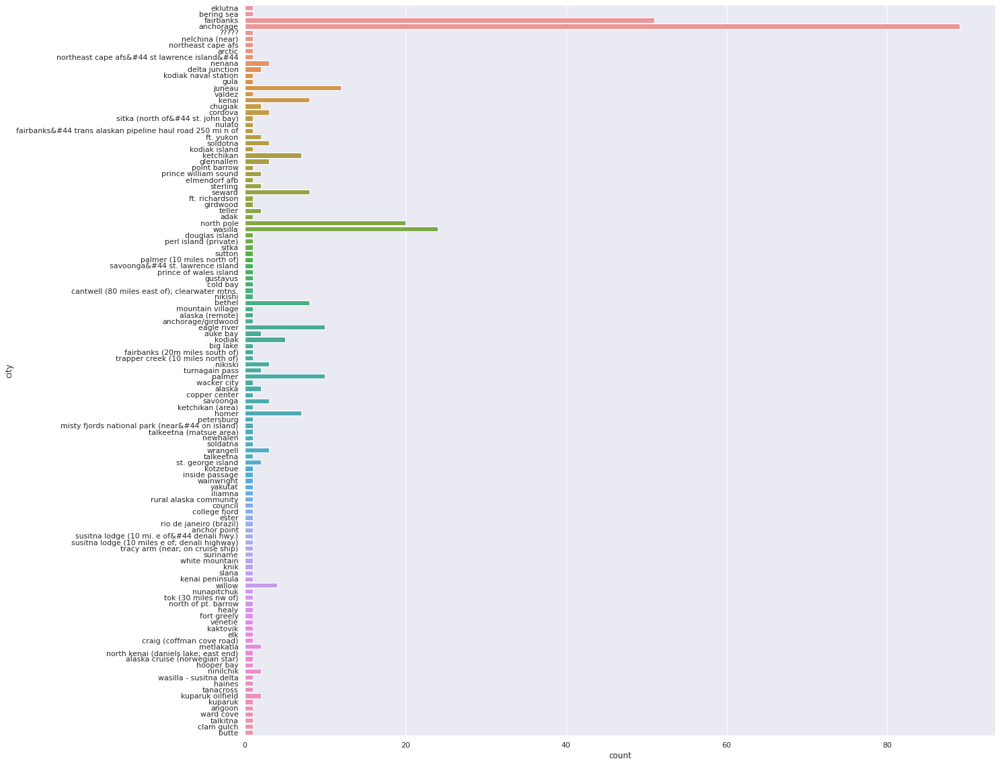

In [ ]:
import seaborn as sns

sns.set(rc={'figure.figsize':(20,20)})
sns.set(style="darkgrid")
sns.countplot(y='city', data=ufo_sight_alaska_df)

# we can see that the number of meetings in 'bering sea' and 'fairbanks' are drastically
# higher then the other places.

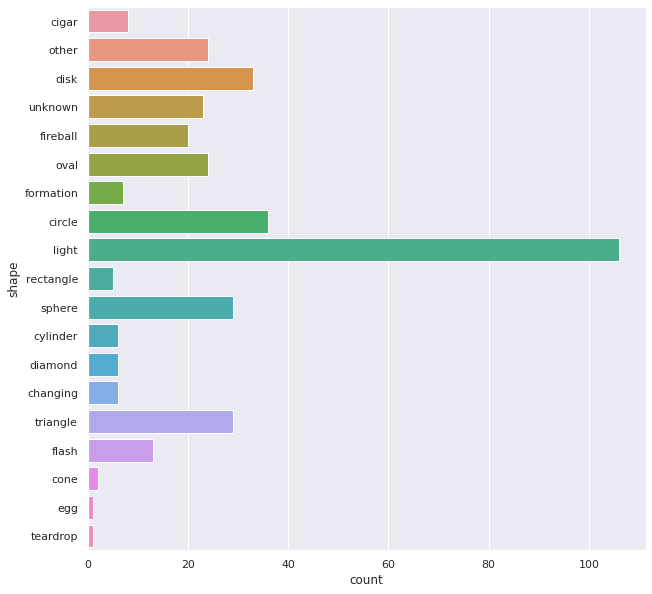

In [ ]:
sns.set(rc={'figure.figsize':(10,10)})
sns.set(style="darkgrid")
sns.countplot(y='shape', data=ufo_sight_alaska_df)

# we can see that the shapes `egg` and `teardrop` are anomalous comparing to the 
# count of other shapes (almost 0). 

5. Find insights:

In [ ]:
import spacy
import numpy as np
import turicreate as tc

nlp = spacy.load('en_core_web_lg')

In [ ]:
# let's try inspect the comments of the meetings, hence concat all of them:
comments = list(ufo_sight_alaska_df['comments'])
concat_comments = " ".join(comments)
concat_comments = concat_comments.replace('.', ' ')
words = concat_comments.split(' ')

from collections import Counter
# we are removig the top 6 which are words like: to/from/of/...
Counter(words).most_common()[6:30]

# by taking a look on the most common words in the `comments` column we can learn a lot!
#(1) we see the word `sky` 72 times (third place), most of the cases were appeard to be 
# in the sky. Perhaps thats because we belive so hard they are coming with spaceships ?
#(2) the words light/bright/red/orange are all at the top to. Seems like all meetings
# included a sonic light visions.


# the most interesting questions is whether all the top was dictated by the films industry ?
# did they made us believe that UFO are coming in spaceships and have red/orange lights around them ?


[('light', 84),
 ('to', 83),
 ('sky', 72),
 ('lights', 70),
 ('over', 60),
 ('object', 56),
 ('on', 56),
 ('was', 55),
 ('moving', 47),
 ('at', 44),
 ('Alaska', 43),
 ('bright', 40),
 ('orange', 38),
 ('with', 38),
 ('I', 36),
 ('from', 35),
 ('it', 32),
 ('then', 31),
 ('red', 29),
 ('for', 25),
 ('very', 25),
 ('above', 24),
 ('shaped', 23),
 ('white', 23)]

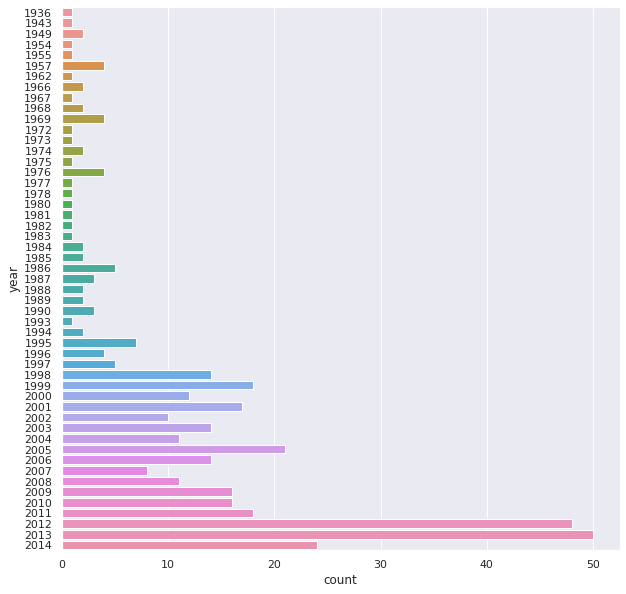

In [ ]:
import seaborn as sns

sns.set(rc={'figure.figsize':(10,10)})
sns.set(style="darkgrid")
sns.countplot(y='year', data=ufo_sight_alaska_df)

# From the figure below we can see that the number of such UFO meeting is increasing
# with time. We can infer from this that people are more awaring to
# the fact that there might be someone else out there
# or that people are ilusioning more (for example due to the use of drugs.)

#3. Business During `COVID19` 

### Theoretical Part:
**Motivation**:

The biggest challenge and reason to frustration among buisness owners during the `COVID19` period is the **uncertainty**.
The uncertainty we all feel during the `COVID19` taking from us the ability to *plan* ahead. In case of a buisness this can be crucial in order to maximize profit and minimize loss. 

Let's see an examples:
1. Imagine a restaurant owner, who need to get food supply in the begining of the work week. In case suddenly the government decides on quarentine or just closing restaurants for social distancing all it's supply will be thrown. This will prevent him from **minimizing loss**.
2. This uncertainty can work in the other way too - what if a restaurant owner
didn't knew that people a going more and more out, hence not getting enough workers. This will hurt his ability to accept more customers at certain point and will prevent him from **maximizing profits**.

Imagine now that the buisness owner could have a *model* that will analyze the 
social activity around him. For example in case the model is detecting that the
area of his restaurant is very crowded relative to previous days then the owner can infer that soon the restaurants in the area will get closed due to `COVID19` infection. Now imagine this on the other way, after a period of quarantine this model could detect that people are starting more to go out, then the buisness owner will get enough  workers.

**General Idea**:

I'll use the `Public Life Data - People Staying` dataset of Seattle Data Portal. The data is describing people who **stay** for periods of **time** in certain **areas**. By creating a model that can predict the amount of people that suppose to be in ceratin area in a ceratin day we could give the owner the power to fog a bit this uncertainty.

In [1]:
!pip install turicreate

     |████████████████████████████████| 91.9MB 63kB/s 
     |████████████████████████████████| 327kB 45.9MB/s 
     |████████████████████████████████| 3.4MB 38.9MB/s 
     |████████████████████████████████| 86.3MB 99kB/s 
     |████████████████████████████████| 3.8MB 44.3MB/s 
     |████████████████████████████████| 450kB 38.9MB/s 
  Created wheel for resampy: filename=resampy-0.2.1-cp36-none-any.whl size=320850 sha256=7564d1399d8a95b101e735af55120edfe898bc62956d0763d10d8aece230211a
  Stored in directory: /root/.cache/pip/wheels/ff/4f/ed/2e6c676c23efe5394bb40ade50662e90eb46e29b48324c5f9b
  Created wheel for gast: filename=gast-0.2.2-cp36-none-any.whl size=7540 sha256=4d9d81b70920fb9f644b4bb99d217722c863f7ad398cb7c4595debf565abf59a
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built resampy gast
ERROR: tensorflow-probability 0.10.0 has requirement gast>=0.3.2, but you'll have gast 0.2.2 which is incompatible.
  Fo

In [2]:
!mkdir ./datasets/seatle-staying/

# download the data from seattle site
!wget -P ./datasets/seatle-staying/ https://data.seattle.gov/api/views/5mzj-4rtf/rows.csv?accessType=DOWNLOAD&bom=true&format=true&delimiter=%3B
!ls -l ./datasets/seatle-staying/

mkdir: cannot create directory ‘./datasets/seatle-staying/’: No such file or directory
--2020-07-01 10:56:26--  https://data.seattle.gov/api/views/5mzj-4rtf/rows.csv?accessType=DOWNLOAD
Resolving data.seattle.gov (data.seattle.gov)... 52.206.140.199, 52.206.140.205, 52.206.68.26
Connecting to data.seattle.gov (data.seattle.gov)|52.206.140.199|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘./datasets/seatle-staying/rows.csv?accessType=DOWNLOAD’

rows.csv?accessType     [  <=>               ]   1.98M  6.28MB/s    in 0.3s    

2020-07-01 10:56:27 (6.28 MB/s) - ‘./datasets/seatle-staying/rows.csv?accessType=DOWNLOAD’ saved [2072540]

total 2024
-rw-r--r-- 1 root root 2072540 Jun 22 23:51 'rows.csv?accessType=DOWNLOAD'


In [96]:
import pandas as pd
from collections import Counter

df_seattle = pd.read_csv("./datasets/seatle-staying/rows.csv?accessType=DOWNLOAD")
# reduce to relevant columns
df_seattle = df_seattle[['study_id', 'location_id', 'staying_time_start', 'staying_group_size']]

In [103]:
import calendar

# let's do some pre processing
def convert_date_format(x):
    date, hour, amppm = x.split(" ")
    month, day, year = date.split('/')
    return f'{year}/{month}/{day}'

def date_to_day(x):
    year, month, day = x.split('/')
    return calendar.weekday(int(year), int(month), int(day))

df_seattle['date'] = df_seattle['staying_time_start'].apply(convert_date_format)
df_seattle['staying_day_of_week'] = df_seattle['date'].apply(date_to_day)

df_seattle

,study_id,location_id,staying_time_start,staying_group_size,date,staying_day_of_week
0,2018_Seattle_Citywide,MAP1,08/02/2018 08:20:00 AM,3,2018/08/02,3
1,2018_Seattle_Citywide,MAP1,08/02/2018 08:20:00 AM,3,2018/08/02,3
2,2018_Seattle_Citywide,MAP1,08/02/2018 08:20:00 AM,3,2018/08/02,3
3,2018_Seattle_Citywide,MAP1,08/02/2018 08:20:00 AM,1,2018/08/02,3
4,2018_Seattle_Citywide,MAP1,08/02/2018 08:20:00 AM,2,2018/08/02,3
...,...,...,...,...,...,...
10711,2019_University_District,UNI7,01/10/2019 11:42:00 AM,1,2019/01/10,3
10712,2019_University_District,UNI7,01/10/2019 04:23:00 PM,1,2019/01/10,3
10713,2019_University_District,UNI7,01/10/2019 04:23:00 PM,1,2019/01/10,3
10714,2019_University_District,UNI7,01/10/2019 04:23:00 PM,1,2019/01/10,3


In [126]:
import turicreate as tc
from turicreate import aggregate as agg
import numpy as np

df_seattle = df_seattle[['location_id', 'staying_group_size', 'date', 'staying_day_of_week']]

# converting `staying_group_size` to float.
df_seattle['staying_group_size'].replace(np.nan,-1, inplace=True)
df_seattle['staying_group_size'].replace('8+', 9, inplace=True)
df_seattle['staying_group_size'] = df_seattle['staying_group_size'].astype(int)
df_seattle.dtypes
df_seattle['staying_group_size'].replace(-1, df_seattle['staying_group_size'].mean(), inplace=True)


# i prefer to use sframe group_by
sf_seattle = tc.SFrame(df_seattle)
sf_seattle_group = sf_seattle.groupby(key_column_names=['location_id', 'date'],
                                       operations={
                                            'staying_day_of_week': agg.MEAN('staying_day_of_week'),
                                            'count_people': agg.SUM('staying_group_size')})
sf_seattle_group = sf_seattle_group.sort('date', ascending = True)
sf_seattle_group.print_rows(num_rows=20, num_columns=4)

+------------+-------------+---------------------+--------------+
|    date    | location_id | staying_day_of_week | count_people |
+------------+-------------+---------------------+--------------+
| 2018/07/14 |     SLU1    |         5.0         |      7       |
| 2018/07/14 |     COM2    |         5.0         |     112      |
| 2018/07/14 |     CID2    |         5.0         |      35      |
| 2018/07/14 |     CID1    |         5.0         |      22      |
| 2018/07/14 |     PIO4    |         5.0         |      25      |
| 2018/07/14 |     CID4    |         5.0         |      47      |
| 2018/07/14 |     PIO2    |         5.0         |      10      |
| 2018/07/14 |     BLT3    |         5.0         |      7       |
| 2018/07/14 |     PIO1    |         5.0         |      38      |
| 2018/07/14 |     PIO3    |         5.0         |     115      |
| 2018/07/14 |     COM1    |         5.0         |      38      |
| 2018/07/14 |     SLU2    |         5.0         |      33      |
| 2018/07/

In [131]:
# now with this data we can create a smarter model that can predict the number of people
# in a certain area for a given date. Since the target variable here is not binary/catergorial
# we will do a more simple solution since this is just a prototype.
# our function will print to the user the number of people in desired area until
# given time, with this information it could infer whether we are going torward
# another quarantine or torwards a relief.
def get_number_of_people_until(until_date, area):
    sf_until_time = sf_seattle_group[sf_seattle_group['date'] < until_date]
    sf_area = sf_until_time[sf_until_time['location_id'] == area]
    return sf_area


In [132]:
# let's make an example:
# as an owner of resaurant in area 'UNI3' i would to see the numbers until 2019/01/10
# since this is the date i wan't to be prepared to.
get_number_of_people_until('2019/01/10', 'UNI3')

# by taking a look in the numbers, we can see that the number of people in the area
# on dates 01/05 amd 01/08 are relativelty high - to the one that were before, hence
# there is a high chance for massive infection in this area and closing of restaurants.

date,location_id,staying_day_of_week,count_people
2018/08/16,UNI3,3.0,14
2018/08/17,UNI3,4.0,16
2018/08/25,UNI3,5.0,6
2019/01/05,UNI3,5.0,61
2019/01/08,UNI3,1.0,22
